# Mask_RCNN

## 理论



<style>
    img{
        width:90%;
        padding-left: 5%;
    }
</style>


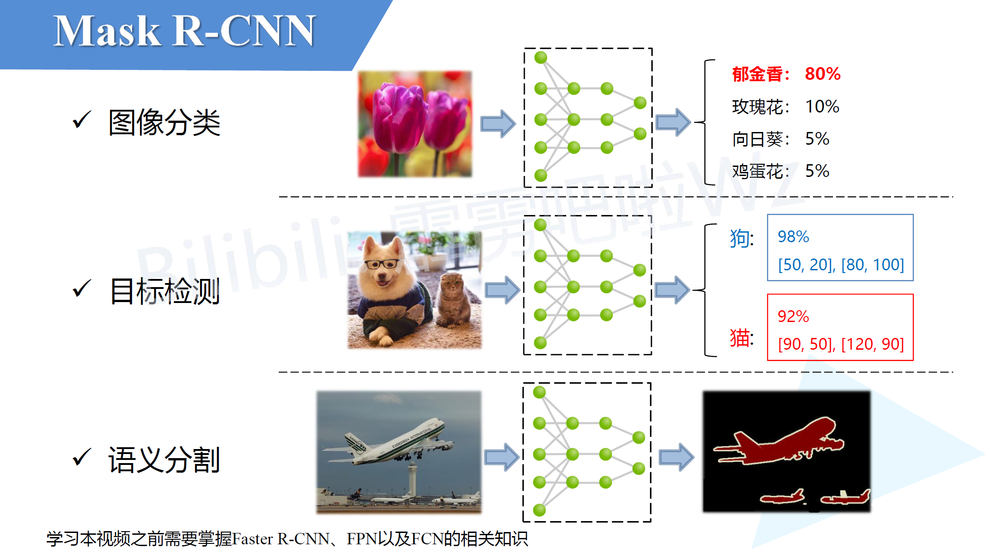

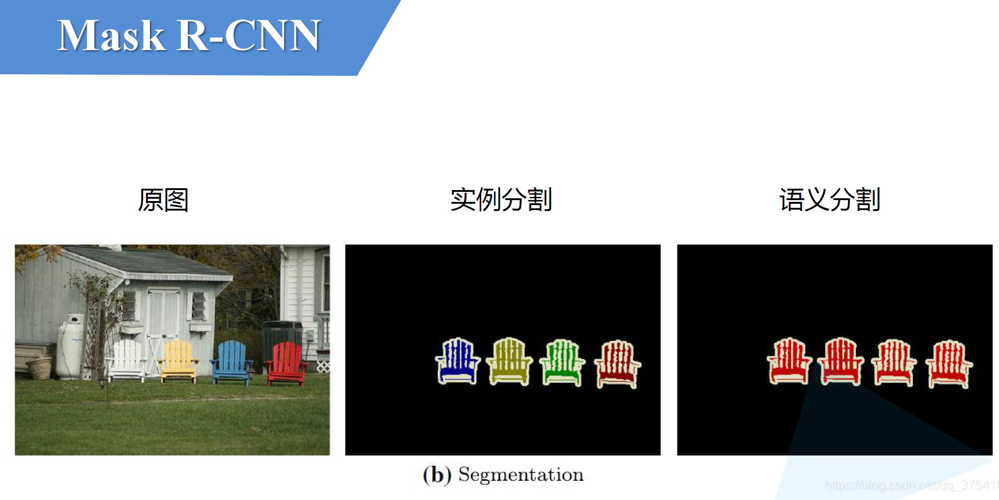

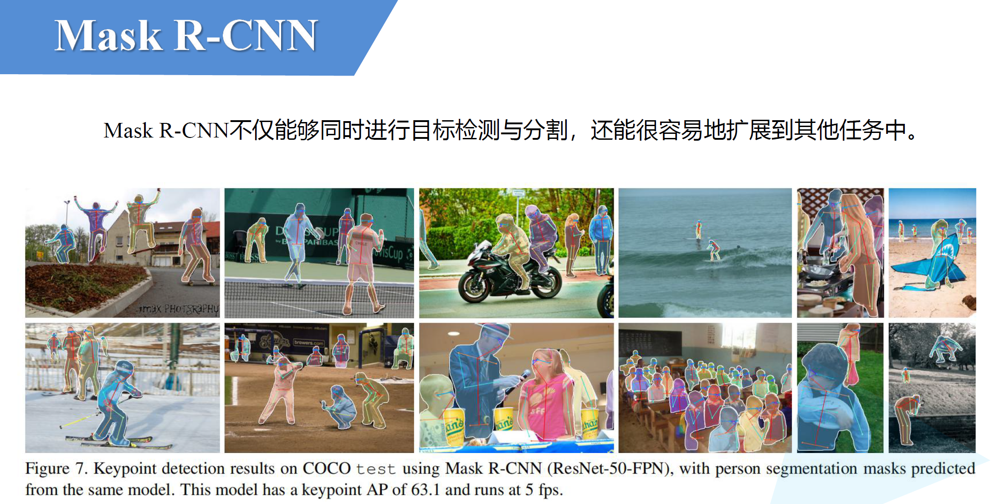

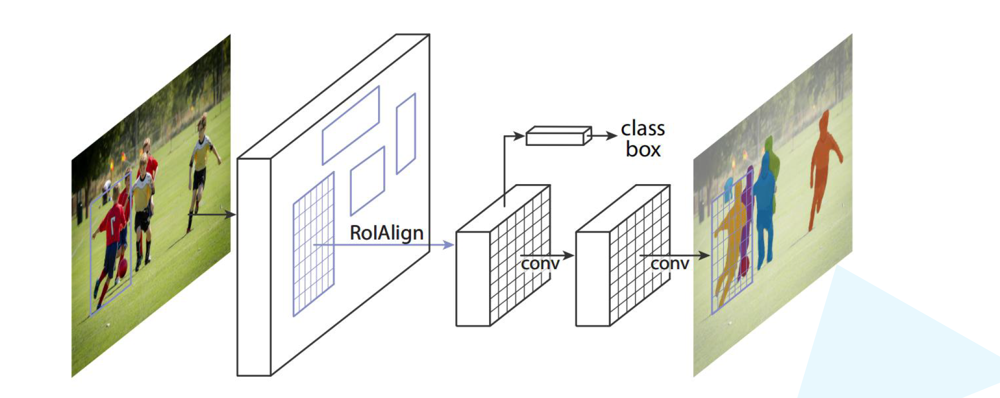

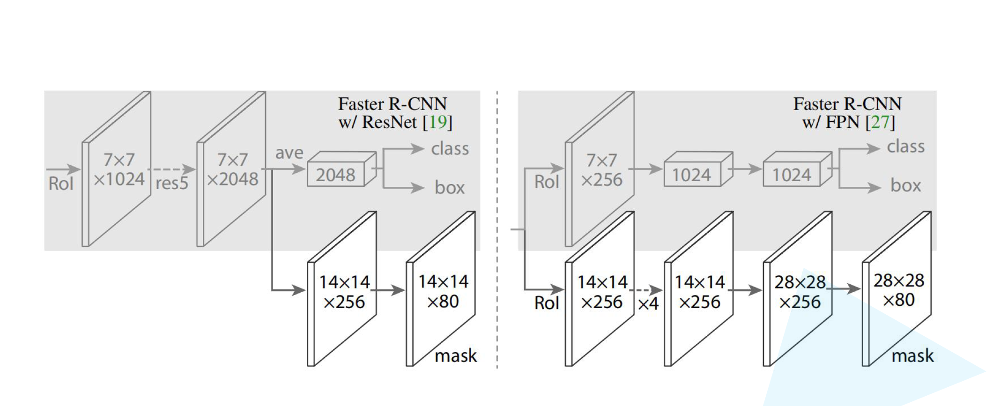

...

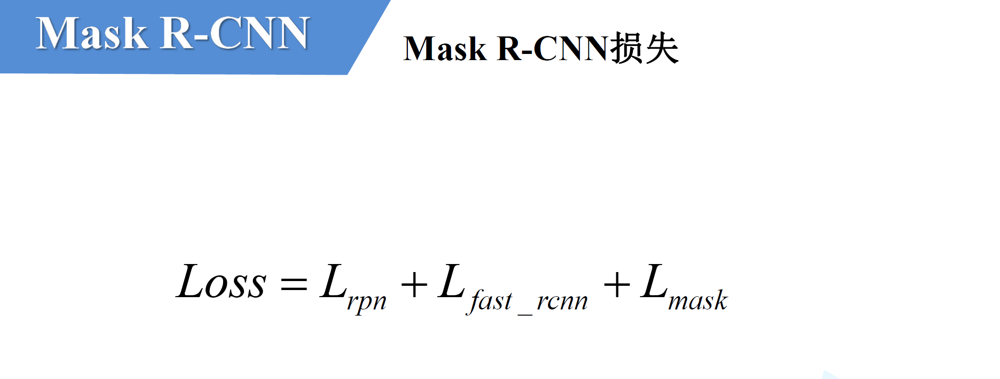

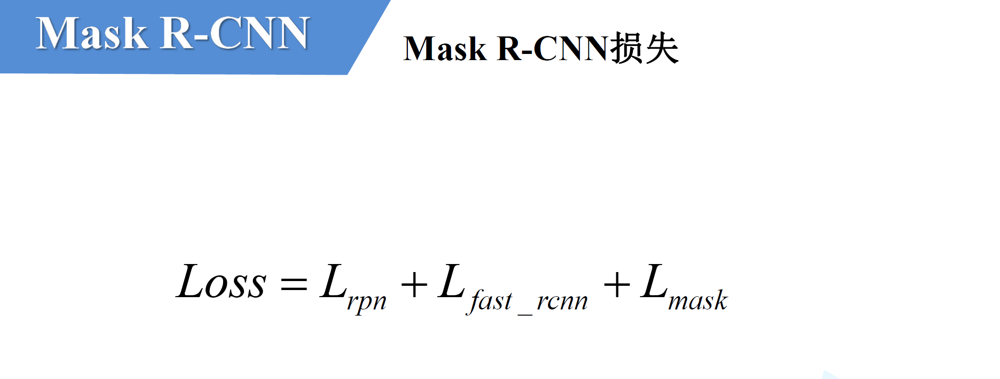

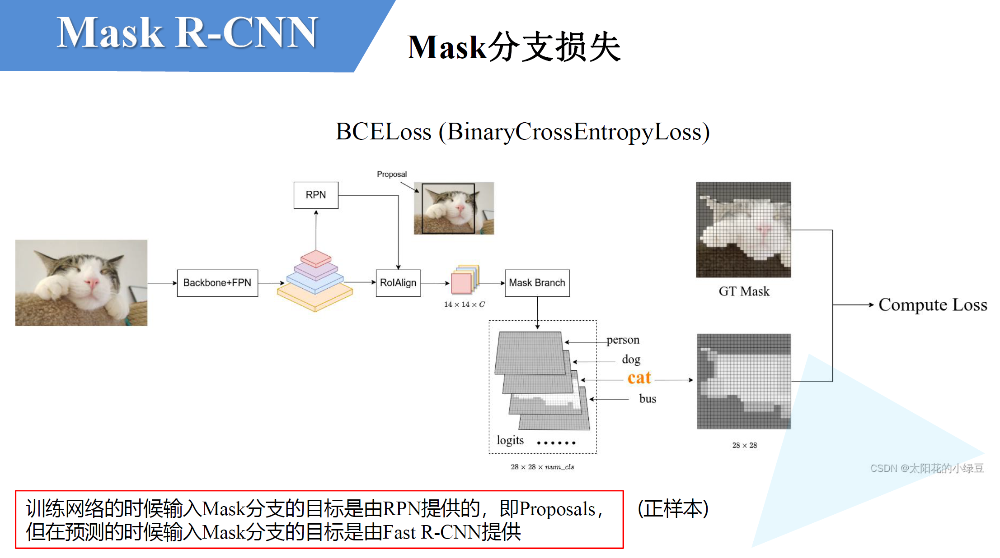

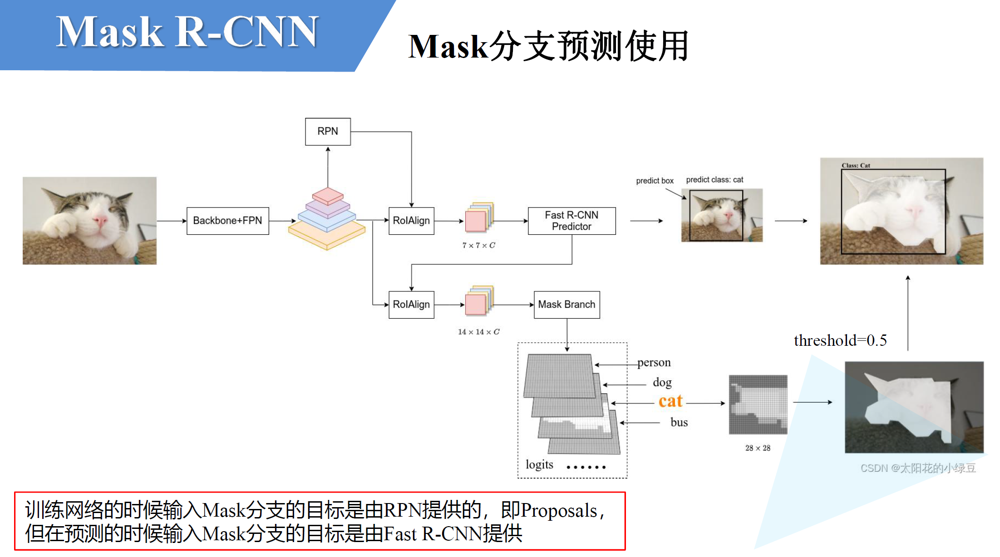

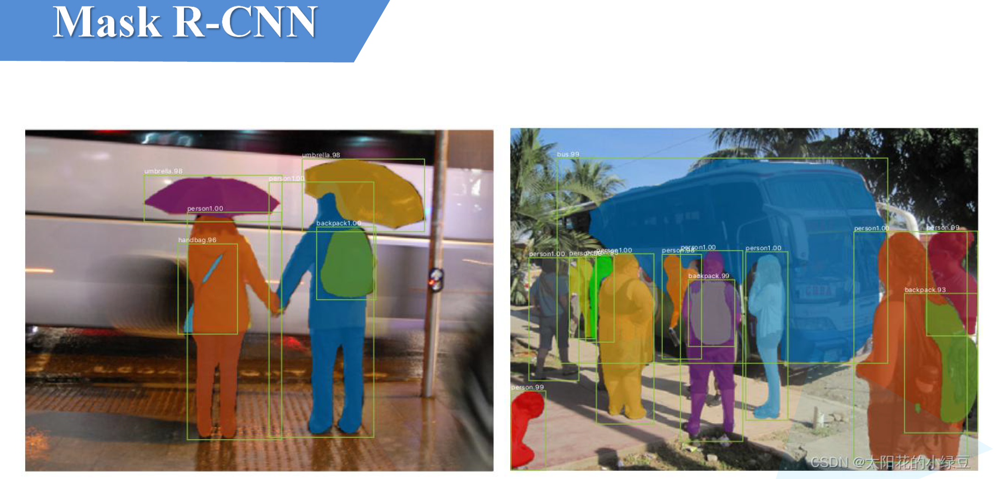

<style>
    img{
        width:90%;
        padding-left: 5%;
    }
</style>

### 0 前言

Mask R-CNN是2017年发表的文章，一作是何恺明大神，没错就是那个男人，除此之外还有Faster R-CNN系列的大神`Ross Girshick`，可以说是强强联合。该论文也获得了ICCV 2017的最佳论文奖（`Marr Prize`）。并且该网络提出后，又霸榜了MS COCO的各项任务，包括目标检测、实例分割以及人体关键点检测任务。在看完这边文章后觉得Mask R-CNN的结构很简洁而且很灵活效果又很好（仅仅是在Faster R-CNN的基础上根据需求加入一些新的分支）。  
![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/8dfe492f35c49d703050d241bed3a682.png)  
注意，阅读本篇文章之前需要掌握Faster R-CNN、FPN以及FCN的相关知识，如果不了解可以参考我之前在哔哩哔哩上做的相关视频。

* * *

### 1 Mask R-CNN

> The method, called Mask R-CNN, extends Faster R-CNN by adding a branch for predicting an object mask in parallel with the existing branch for bounding box recognition.

Mask R-CNN是在Faster R-CNN的基础上加了一个用于预测目标分割Mask的分支（即可预测目标的Bounding Boxes信息、类别信息以及分割Mask信息）。

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/be5b79f8e91e7d1001d4f9211efb8b2b.png)

> Moreover, Mask R-CNN is easy to generalize to other tasks, e.g., allowing us to estimate human poses in the same framework.

Mask R-CNN不仅能够同时进行目标检测与分割，还能很容易地扩展到其他任务，比如再同时预测人体关键点信息。

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/5f1fc031131fea9903bb86a51feeba8c.png)

> Our method, called Mask R-CNN, extends Faster R-CNN by adding a branch for predicting segmentation masks on each Region of Interest (RoI), in parallel with the existing branch for classification and bounding box regression (Figure 1). The mask branch is a small FCN applied to each RoI, predicting a segmentation mask in a pixel-to-pixel manner.

Mask R-CNN的结构也很简单，就是在通过`RoIAlign`（在原Faster R-CNN中是`RoIPool`）得到的RoI基础上并行添加一个Mask分支（小型的FCN）。见下图，之前Faster R-CNN是在RoI基础上接上一个Fast R-CNN检测头，即图中**class, box**分支，现在又并行了一个Mask分支。

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/8dfe492f35c49d703050d241bed3a682.png)

**注意带和不带FPN结构的Mask R-CNN在Mask分支上略有不同，对于带有FPN结构的Mask R-CNN它的class、box分支和Mask分支并不是共用一个RoIAlign**。在训练过程中，对于**class, box**分支`RoIAlign`将`RPN`（Region Proposal Network）得到的`Proposals`池化到`7x7`大小，而对于Mask分支`RoIAlign`将`Proposals`池化到`14x14`大小。详情参考原论文中的图4.

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/a84e46c865f2ad53a8de7efb893ec287.png)

* * *

### 2 RoI Align

> Faster R-CNN was not designed for pixel-to-pixel alignment between network inputs and outputs. This is most evident in how RoIPool, the de facto core operation for attending to instances, performs coarse spatial quantization for feature extraction.

在之前的Faster RCNN中，会使用`RoIPool`将`RPN`得到的`Proposal`池化到相同大小。这个过程会涉及`quantization`或者说取整操作，这会导致定位不是那么的准确（文中称为`misalignment`问题）。

下面的示意图就是`RoIPool`的执行过程，其中会经历两次`quantization`。假设通过`RPN`得到了一个`Proposal`，它在原图上的左上角坐标是 ( 10 , 10 ) (10,10) (10,10)，右下角的坐标是 ( 124 , 124 ) (124,124) (124,124)，对应要映射的特征层相对原图的步距为32，通过`RoIPool`期望的输出为`2x2`大小：

+   将`Proposal`映射到特征层上，对于左上角坐标 10 32 $ \frac{10}{32} $ 3210​四舍五入后等于0，对于右下角坐标 124 32 \frac{124}{32} 32124​四舍五入后等于4，即映射在特征层上的左上角坐标为 ( 0 , 0 ) (0,0) (0,0)右下角坐标为 ( 4 , 4 ) (4,4) (4,4)。对应下图特征层上从第0行到第4行，从第0列到第4列的区域（黑色矩形框）。这是第一次`quantization`。
+   由于期望的输出为`2x2`大小，所以需要将映射在特征层上的`Proposal`划分成`2x2`大小区域。但现在映射在特征层上的`Proposal`是`5x5`大小，无法均分，所以强行划分后有的区域大有的区域小，如下图所示。这是第二次`quantization`。
+   对划分后的每个子区域进行`maxpool`即可得到`RoIPool`的输出，即 ( 1.6871 0.4676 2.0242 2.3571 ) \\begin{pmatrix} 1.6871 & 0.4676\\\\ 2.0242 & 2.3571 \\end{pmatrix} (1.68712.0242​0.46762.3571​)。在2.1章节有对应的Pytorch实验。

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/2e8b9253b6b6063809d92b7380390488.png)

> To fix the misalignment, we propose a simple, quantization-free layer, called RoIAlign, that faithfully preserves exact spatial locations.

为了解决这个问题，作者提出了`RoIAlign`方法替代`RoIPool`，以获得更加精确的空间定位信息。

> RoIAlign has a large impact: it improves mask accuracy by relative 10% to 50%, showing bigger gains under stricter localization metrics. Second, we found it essential to decouple mask and class prediction: we predict a binary mask for each class independently, without competition among classes, and rely on the network’s RoI classification branch to predict the category.

作者在文中提到，将`RoIPool`替换成`RoIAlign`后，分割的Mask准确率相对提升了10%到50%（见下图d），并且将预测Mask和class进行了解耦，解耦后也带来了很大的提升（见下图b），这个在后面会细讲。

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/4c6252bc9882fb80328eeaf2a5b63c5b.png)

下面的示意图就是`RoIAlign`的执行过程。同样假设通过`RPN`得到了一个`Proposal`，它在原图上的左上角坐标是 ( 10 , 10 ) (10,10) (10,10)，右下角的坐标是 ( 124 , 124 ) (124,124) (124,124)，对应要映射的特征层相对原图的步距为32，通过`RoIAlign`期望的输出为`2x2`大小：

+   将`Proposal`映射到特征层上，左上角坐标 ( 0.3125 , 0.3125 ) (0.3125, 0.3125) (0.3125,0.3125)(不进行四舍五入)，右下角坐标 ( 3.875 , 3.875 ) (3.875, 3.875) (3.875,3.875)(不进行四舍五入)。为了方便理解，将特征层上的每个元素用一个点表示，就能得到图中下方的`grid`网格。图中蓝色的矩形框就是`Proposal`（没有`quantization`）。
+   由于期望输出为`2x2`大小，故将`Proposal`划分为`2x2`四个子区域（没有`quantization`）。接着根据`sampling_ratio`在每个子区域中设置采样点，原论文中默认设置的`sampling_ratio`为4，这里为了方便讲解将`sampling_ratio`设置成1。
+   然后计算每个子区域中每个采样点的值（利用双线性插值计算），最后对每个区域内的所有采样点取均值即为该子区域的输出。

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/4f7cc822a065e10d814dddcdf7bb0e4c.png)

这里以第一个子区域为例，因为这里将`sampling_ratio`设置成为1，所以每个子区域只需要设置一个采样点。第一个子区域的采样点为图中黄色的点（即为该子区域的中心点），坐标为 ( 1.203125 , 1.203125 ) (1.203125,1.203125) (1.203125,1.203125)，然后找出离该采样点最近的四个点（即图中用红色箭头标出的四个黑点），然后利用双线性插值即可计算得到采样点对应的输出 − 0.8546 -0.8546 −0.8546（如果不了解双线性插值可参考我之前写的[博文](https://blog.csdn.net/qq_37541097/article/details/112564822)），又由于该子区域只有一个采样点，故该子区域的输出就为 − 0.8546 -0.8546 −0.8546。在2.2章节有对应的Pytorch实验。  
![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/880a4b0d41d8dd4ca5f450d26b28e3d7.png)

> We note that the results are not sensitive to the exact sampling locations, or how many points are sampled, as long as no quantization is performed.

最后作者在论文中有提到，关于最终的采样结果对采样点位置，以及采样点的个数并不敏感。

* * *

#### 2.1 RoIPool实验

实验还是按照前面讲的内容来进行对比。

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/2e8b9253b6b6063809d92b7380390488.png)

下面是使用Torchvision库中实现的`RoIPool`方法，通过对比计算结果和我们刚刚讲的是一样的。

```python
import torch
from torchvision.ops import RoIPool


def main():
    torch.manual_seed(1)
    x = torch.randn((1, 1, 6, 6))
    print(f"feature map: \n{x}")
	
    proposal = [torch.as_tensor([[10, 10, 124, 124]], dtype=torch.float32)]
    roi_pool = RoIPool(output_size=2, spatial_scale=1/32)
    roi = roi_pool(x, proposal)
    print(f"roi pool: \n{roi}")


if __name__ == '__main__':
    main()
```

终端输出：

```
feature map: 
tensor([[[[-1.5256, -0.7502, -0.6540, -1.6095, -0.1002, -0.6092],
          [-0.9798, -1.6091, -0.7121,  0.3037, -0.7773, -0.2515],
          [-0.2223,  1.6871,  0.2284,  0.4676, -0.6970, -1.1608],
          [ 0.6995,  0.1991,  0.1991,  0.0457,  0.1530, -0.4757],
          [-1.8821, -0.7765,  2.0242, -0.0865,  2.3571, -1.0373],
          [ 1.5748, -0.6298,  2.4070,  0.2786,  0.2468,  1.1843]]]])
roi pool: 
tensor([[[[1.6871, 0.4676],
          [2.0242, 2.3571]]]])
```

* * *

#### 2.2 RoIAlign实验

实验还是按照前面讲的内容来进行对比。  
![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/4f7cc822a065e10d814dddcdf7bb0e4c.png)

下面是使用Torchvision库中实现的`RoIAlign`方法，通过对比计算结果和我们刚刚讲的是一样的。

```python
import torch
from torchvision.ops import RoIAlign


def bilinear(u, v, f1, f2, f3, f4):
    return (1-u)*(1-v)*f1 + u*(1-v)*f2 + (1-u)*v*f3 + u*v*f4


def main():
    torch.manual_seed(1)
    x = torch.randn((1, 1, 6, 6))
    print(f"feature map: \n{x}")
    
    proposal = [torch.as_tensor([[10, 10, 124, 124]], dtype=torch.float32)]
    roi_align = RoIAlign(output_size=2, spatial_scale=1/32, sampling_ratio=1)
    roi = roi_align(x, proposal)
    print(f"roi align: \n{roi}")

    u = 0.203125
    v = 0.203125
    f1 = x[0, 0, 1, 1]  # -1.6091
    f2 = x[0, 0, 1, 2]  # -0.7121
    f3 = x[0, 0, 2, 1]  # 1.6871
    f4 = x[0, 0, 2, 2]  # 0.2284
    print(f"bilinear: {bilinear(u, v, f1, f2, f3, f4):.4f}")


if __name__ == '__main__':
    main()
```

终端输出：

```
feature map: 
tensor([[[[-1.5256, -0.7502, -0.6540, -1.6095, -0.1002, -0.6092],
          [-0.9798, -1.6091, -0.7121,  0.3037, -0.7773, -0.2515],
          [-0.2223,  1.6871,  0.2284,  0.4676, -0.6970, -1.1608],
          [ 0.6995,  0.1991,  0.1991,  0.0457,  0.1530, -0.4757],
          [-1.8821, -0.7765,  2.0242, -0.0865,  2.3571, -1.0373],
          [ 1.5748, -0.6298,  2.4070,  0.2786,  0.2468,  1.1843]]]])
roi align: 
tensor([[[[-0.8546,  0.3236],
          [ 0.2177,  0.0546]]]])
bilinear: -0.8546
```

* * *

### 3 Mask Branch(FCN)

前面有提到，对于带有FPN和不带有FPN的Mask R-CNN，他们的Mask分支不太一样。下图左边是不带FPN结构的Mask分支，右侧是带有FPN结构的Mask分支（灰色部分为原Faster R-CNN预测box, class信息的分支，白色部分为Mask分支）。  
![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/2c2d1464130f82f4ec600d0e2e659487.png)  
由于在我们日常使用中，一般都是使用的带有FPN的网络，所以我自己又手绘了一幅针对带有FPN结构的Mask分支：

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/af52df2a5532eef8c5e53b5d3f6a3b73.png#pic_center)

之前在讲FCN的时候有提到过，FCN是对每个像素针对每个类别都会预测一个分数，然后通过`softmax`得到每个类别的概率（不同类别之间存在竞争关系），哪个概率高就将该像素分配给哪个类别。但在Mask R-CNN中，作者将预测Mask和class进行了解耦，即对输入的RoI针对每个类别都单独预测一个Mask，最终根据box, cls分支预测的classes信息来选择对应类别的Mask（不同类别之间不存在竞争关系）。作者说解耦后带来了很大的提升。下表是原论文中给出的消融实验结果，其中`softmax`代表原FCN方式（Mask和class未解耦），`sigmoid`代表Mask R-CNN中采取的方式（Mask和class进行了解耦）。  
![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/5d2a9850eb7e8677374b105ef4ebbcd1.png)

**这里还有一个需要注意的细节。在训练网络的时候输入Mask分支的目标是由RPN提供的，即Proposals，但在预测的时候输入Mask分支的目标是由Fast R-CNN提供的（即预测的最终目标）。** 并且训练时采用的Proposals全部是Fast R-CNN阶段匹配到的正样本。这里说下我个人的看法（不一定正确），在训练时Mask分支利用RPN提供的目标信息能够扩充训练样本的多样性（因为RPN提供的目标边界框并不是很准确，一个目标可以呈现出不同的情景，类似于围着目标做随机裁剪。从另一个方面来看，通过Fast R-CNN得到的输出一般都比较准确了，再通过NMS后剩下的目标就更少了）。在预测时为了获得更加准确的目标分割信息以及减少计算量（通过Fast R-CNN后的目标数会更少），此时利用的是Fast R-CNN提供的目标信息。

* * *

### 4 其他细节

#### 4.1 Mask R-CNN损失

Mask R-CNN的损失就是在Faster R-CNN的基础上加上了Mask分支上的损失，即：  
$$ Loss=L_{rpn}+L_{fast\_rcnn}+L_{mask} $$
关于Faster R-CNN的损失计算之前视频里讲过，这里就不在赘述。关于Mask分支上的损失就是二值交叉熵损失(Binary Cross Entropy)。

* * *

#### 4.2 Mask分支损失

在讲Mask分支损失计算之前，我们要弄清楚`logits`（网络预测的输出）是什么，`targets`（对应的GT）是什么。前面有提到训练时输入Mask分支的目标是RPN提供的Proposals，所以网络预测的`logits`是针对每个Proposal对应每个类别的Mask信息（注意预测的Mask大小都是`28x28`）。并且这里输入的Proposals都是正样本（在Fast R-CNN阶段采样得到的），对应的GT信息（box、cls）也是知道的。

如下图所示，假设通过RPN得到了一个Proposal（图中黑色的矩形框），通过RoIAlign后得到对应的特征信息（shape为`14x14xC`），接着通过Mask Branch预测每个类别的Mask信息得到图中的`logits`（`logits`通过`sigmoid`激活函数后，所有值都被映射到0至1之间）。通过Fast R-CNN分支正负样本匹配过程我们能够知道该Proposal的GT类别为猫（`cat`），所以将`logits`中对应类别猫的预测mask（shape为`28x28`）提取出来。然后根据Proposal在原图对应的GT上裁剪并缩放到`28x28`大小，得到图中的GT mask（对应目标区域为1，背景区域为0）。最后计算`logits`中预测类别为猫的mask与GT mask的BCELoss（`BinaryCrossEntropyLoss`）即可。

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/a782a135c5cec74fc6b27b1aae385cdd.png#pic_center)

* * *

#### 4.3 Mask Branch预测使用

**这里再次强调一遍，在真正预测推理的时候，输入Mask分支的目标是由Fast R-CNN分支提供的。**

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/bc47a74d26d872f1583c59b5d96c1330.png#pic_center)

如上图所示，通过Fast R-CNN分支，我们能够得到最终预测的目标边界框信息以及类别信息。接着将目标边界框信息提供给Mask分支就能预测得到该目标的`logits`信息，再根据Fast R-CNN分支提供的类别信息将`logits`中对应该类别的Mask信息提取出来，即针对该目标预测的Mask信息（shape为`28x28`，由于通过`sigmoid`激活函数，数值都在0到1之间）。然后利用双线性插值将Mask缩放到预测目标边界框大小，并放到原图对应区域。接着通过设置的阈值（默认为0.5）将Mask转换成一张二值图，比如预测值大于0.5的区域设置为前景剩下区域都为背景。现在对于预测的每个目标我们就可以在原图中绘制出边界框信息，类别信息以及目标Mask信息。

![在这里插入图片描述](https://i-blog.csdnimg.cn/blog_migrate/cdcde83371d71ceb0a9cee5329dd7d97.png)  


In [2]:
from typing import Optional, Dict, List, Tuple
import torch


def select_pos_samples(
    training: bool,
    proposals: List[torch.Tensor],
    labels: List[torch.Tensor],
    results: Optional[List[Dict[str, torch.Tensor]]],
    matched_idxs: Optional[List[torch.Tensor]],
):
    mask_proposals = [p["boxes"] for p in results]  # 将最终预测的Boxes信息取出
    if training:
        # matched_idxs为每个proposal在正负样本匹配过程中得到的gt索引(背景的gt索引也默认设置成了0)
        if matched_idxs is None:
            raise ValueError("if in training, matched_idxs should not be None")

        # during training, only focus on positive boxes
        num_images = len(proposals)
        mask_proposals = []
        pos_matched_idxs = []
        for img_id in range(num_images):
            pos = torch.where(labels[img_id] > 0)[0]  # 寻找对应gt类别大于0，即正样本
            mask_proposals.append(proposals[img_id][pos])
            pos_matched_idxs.append(matched_idxs[img_id][pos])
    else:
        pos_matched_idxs = None
    return mask_proposals, pos_matched_idxs